In [2]:
#!pip install tensorflow
#!pip install sklearn

In [71]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses, optimizers, callbacks, models
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

In [1077]:
normal = pd.read_csv('data/normal.csv', header = None)
normal

,0,1,2,3,4,5,6,7
0,4.49670,0.972110,0.35217,0.071360,-0.32078,0.004632,-0.124090,-0.082553
1,4.62210,1.062900,0.11736,0.066884,-0.31932,0.008688,-0.169270,-0.038890
2,4.52350,0.495490,0.26339,0.089698,-0.32395,0.007418,-0.204590,-0.093480
3,4.59700,1.368500,0.18223,0.105650,-0.31137,0.005723,-0.216510,-0.012386
4,4.54710,-0.097405,-0.00506,0.098420,-0.34114,0.005056,-0.263560,-0.062133
...,...,...,...,...,...,...,...,...
499995,-0.69183,-1.055000,0.20844,0.096943,-0.42453,-0.046785,-0.041851,-0.000242
499996,-0.68200,0.885770,0.46704,0.174960,-0.34667,-0.046085,-0.037824,-0.028717
499997,-0.68917,-1.170400,-0.19899,-0.011720,-0.46921,-0.050359,-0.222820,0.158640
499998,-0.68618,-0.297140,0.53274,-0.005098,-0.35727,-0.049846,-0.180170,-0.188250


In [766]:
from scipy import signal

normal_data = signal.resample(normal[7], len(normal[7])//5)
normal_data = np.array(normal_data).reshape(-1,200)

In [665]:
normal_data.shape

(500, 200)

In [767]:
imbalance = pd.read_csv('data/imbalance.csv', header = None)
imbalance_data = signal.resample(imbalance[7], len(imbalance[7])//5)
imbalance_data = np.array(imbalance_data).reshape(-1,200)

In [768]:
normal_test = pd.read_csv('data/normal_test.csv', header = None)
normal_test = signal.resample(normal_test[7], len(normal_test[7])//5)
normal_test = np.array(normal_test).reshape(-1,200)

In [72]:
normal = pd.read_csv('data/normal.csv', header = None)
normal_data = np.array(normal[7]).reshape(-1,1000)

imbalance = pd.read_csv('data/imbalance.csv', header = None)
imbalance_data = np.array(imbalance[7]).reshape(-1,1000)

normal_test = pd.read_csv('data/normal_test.csv', header = None)
normal_test = np.array(normal_test[7]).reshape(-1,1000)

normal_data.shape

(500, 1000)

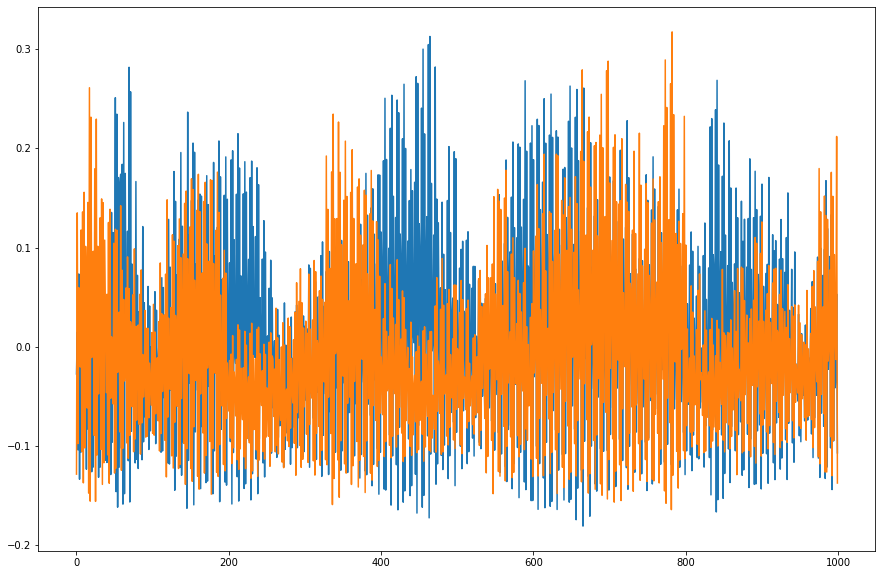

In [73]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
plt.plot(imbalance_data[122])
plt.plot(normal_data[122])


In [769]:
class AnomalyDetector(Model):
    def __init__(self):
        super(AnomalyDetector, self).__init__()
        self.encoder = tf.keras.Sequential([
          #layers.Dense(256, activation="relu"),
          layers.Dense(128, activation="relu"),
          layers.Dense(64, activation="relu"),
          layers.Dense(32, activation="relu"),
        ])

        self.decoder = tf.keras.Sequential([
          layers.Dense(32, activation="relu"),
          layers.Dense(64, activation="relu"),
          #layers.Dense(128, activation="relu"),
          layers.Dense(200, activation="tanh")])
    
    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

autoencoder = AnomalyDetector()
autoencoder.compile(optimizer=optimizers.Adam(learning_rate=7e-4)
                    , loss='mae')

In [88]:
class AnomalyDetector(Model):
    def __init__(self):
        super(AnomalyDetector, self).__init__()
        self.encoder = tf.keras.Sequential([
          layers.Dense(256, activation="relu"),
          layers.Dense(128, activation="relu"),
          layers.Dense(64, activation="relu"),
          layers.Dense(32, activation="relu"),
        ])

        self.decoder = tf.keras.Sequential([
          layers.Dense(32, activation="relu"),
          layers.Dense(64, activation="relu"),
          layers.Dense(128, activation="relu"),
          layers.Dense(1000, activation="tanh")])
    
    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

autoencoder = AnomalyDetector()
autoencoder.compile(optimizer=optimizers.Adam(learning_rate=5e-4)
                    , loss='mae')

In [89]:
estop = callbacks.EarlyStopping(monitor='val_loss', patience=30, verbose=0, mode='min',restore_best_weights=True)

history = autoencoder.fit(normal_data, normal_data, 
          epochs=300, 
          batch_size=16,
          validation_data=(normal_test, normal_test), #callbacks = [estop],
          shuffle=True)

Epoch 1/300
32/32 [==============================] - 1s 8ms/step - loss: 0.1080 - val_loss: 0.1013
Epoch 2/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0676 - val_loss: 0.0617
Epoch 3/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0499 - val_loss: 0.0557
Epoch 4/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0483 - val_loss: 0.0551
Epoch 5/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0477 - val_loss: 0.0549
Epoch 6/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0476 - val_loss: 0.0548
Epoch 7/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0473 - val_loss: 0.0543
Epoch 8/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0471 - val_loss: 0.0544
Epoch 9/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0471 - val_loss: 0.0545
Epoch 10/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0470 - val_loss: 0.0546
Epoch 11/

32/32 [==============================] - 0s 5ms/step - loss: 0.0349 - val_loss: 0.0484
Epoch 84/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0349 - val_loss: 0.0482
Epoch 85/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0348 - val_loss: 0.0482
Epoch 86/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0349 - val_loss: 0.0482
Epoch 87/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0348 - val_loss: 0.0481
Epoch 88/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0346 - val_loss: 0.0481
Epoch 89/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0346 - val_loss: 0.0480
Epoch 90/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0345 - val_loss: 0.0483
Epoch 91/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0343 - val_loss: 0.0481
Epoch 92/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0342 - val_loss: 0.0479
Epoch 93/300


32/32 [==============================] - 0s 5ms/step - loss: 0.0309 - val_loss: 0.0475
Epoch 165/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0310 - val_loss: 0.0477
Epoch 166/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0308 - val_loss: 0.0475
Epoch 167/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0306 - val_loss: 0.0475
Epoch 168/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0306 - val_loss: 0.0475
Epoch 169/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0306 - val_loss: 0.0473
Epoch 170/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0305 - val_loss: 0.0474
Epoch 171/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0303 - val_loss: 0.0474
Epoch 172/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0304 - val_loss: 0.0474
Epoch 173/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0303 - val_loss: 0.0473
Epoc

32/32 [==============================] - 0s 6ms/step - loss: 0.0285 - val_loss: 0.0477
Epoch 246/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0282 - val_loss: 0.0476
Epoch 247/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0284 - val_loss: 0.0475
Epoch 248/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0285 - val_loss: 0.0475
Epoch 249/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0281 - val_loss: 0.0474
Epoch 250/300
32/32 [==============================] - 0s 5ms/step - loss: 0.0280 - val_loss: 0.0475
Epoch 251/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0279 - val_loss: 0.0475
Epoch 252/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0281 - val_loss: 0.0475
Epoch 253/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0282 - val_loss: 0.0477
Epoch 254/300
32/32 [==============================] - 0s 6ms/step - loss: 0.0282 - val_loss: 0.0476
Epoc

In [90]:
true = normal_test[16]
true = imbalance_data[16]

In [91]:
pred = autoencoder.predict(np.expand_dims(true, 0))

In [92]:
from sklearn.metrics import mean_absolute_error as mae
mae(pred[0], true)

0.03711507229714258

In [93]:
norm_mae = mae(normal_test, autoencoder.predict(normal_test))
norm_mae

0.04775861933939098

In [94]:
imb_mae = mae(imbalance_data, autoencoder.predict(imbalance_data))
imb_mae

0.044939434716323716

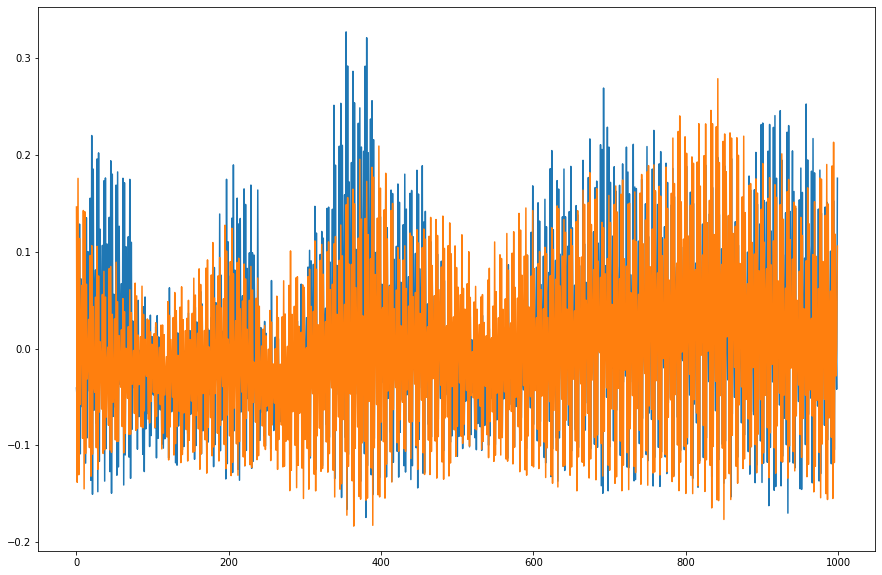

In [95]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
plt.plot(true)
plt.plot(pred[0])


<AxesSubplot:>

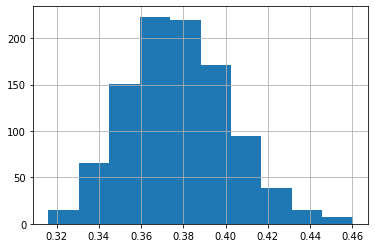

In [1026]:
(abs(pd.DataFrame(autoencoder.predict(normal_test)) - pd.DataFrame(normal_test))).mean().hist()

<AxesSubplot:>

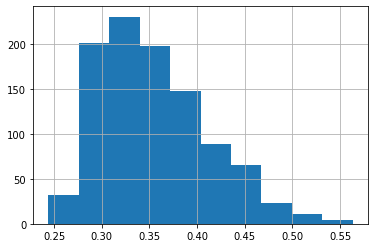

In [1027]:
(abs(pd.DataFrame(autoencoder.predict(imbalance_data)) - pd.DataFrame(imbalance_data))).mean().hist()

In [1061]:
#autoencoder.save('model/')

INFO:tensorflow:Assets written to: model/assets


In [96]:
#model = models.load_model('model/')
model = autoencoder

In [83]:
model.summary()

Model: "anomaly_detector"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 32)                299488    
                                                                 
 sequential_1 (Sequential)   (None, 1000)              140488    
                                                                 
Total params: 439,976
Trainable params: 439,976
Non-trainable params: 0
_________________________________________________________________


In [84]:
import os
normal_path = './data/normal/'
imbalanced_path = './data/imbalanced/'
misalignment_path = './data/misalignment/'
normal_cases = os.listdir(normal_path)
imbalanced_cases = os.listdir(imbalanced_path)
misalignment_cases = os.listdir(misalignment_path)

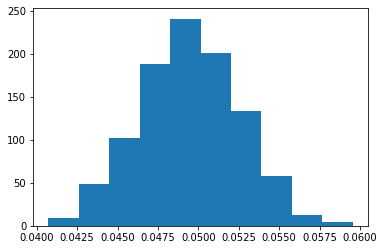

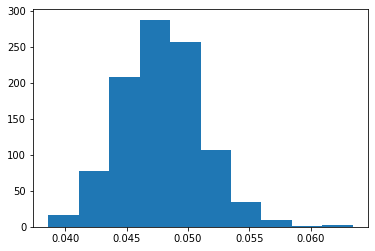

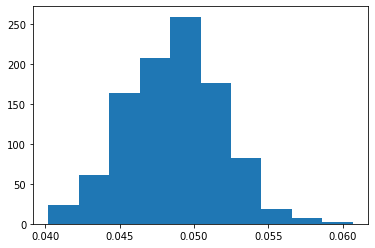

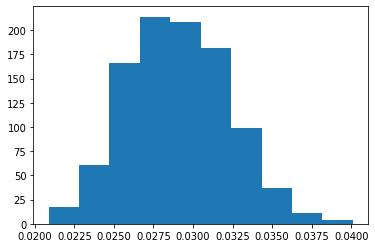

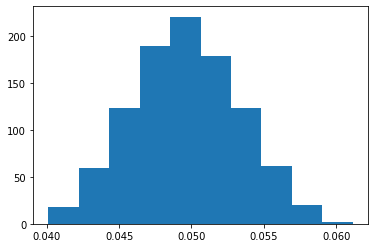

In [98]:
for case in normal_cases[:5]:
    data = pd.read_csv(normal_path+case, header = None)
    data = np.array(data[7]).reshape(-1,1000)
    
    plt.hist(abs(pd.DataFrame(model.predict(data)) - pd.DataFrame(data)).mean())
    plt.show()

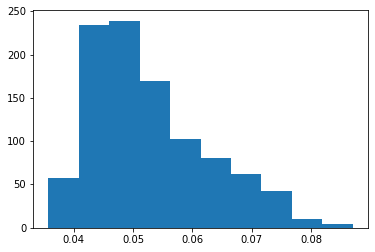

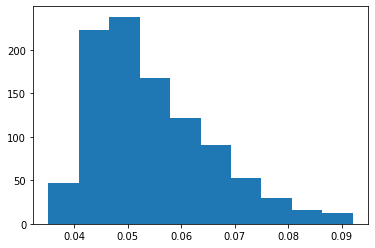

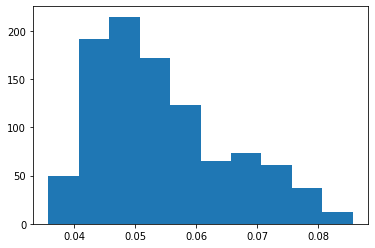

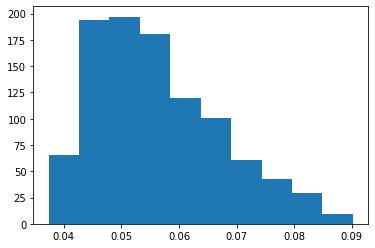

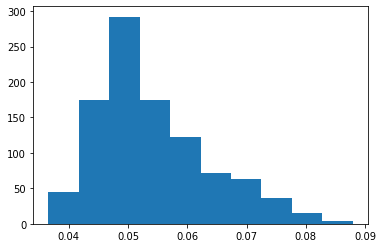

...

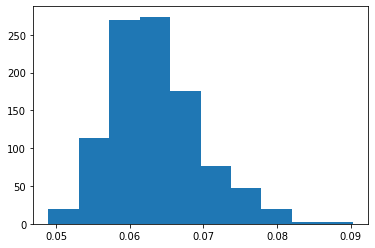

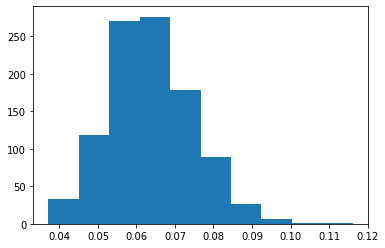

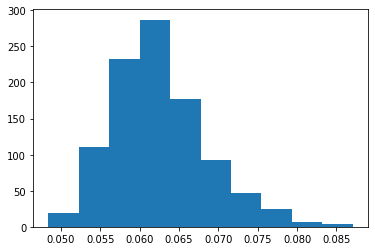

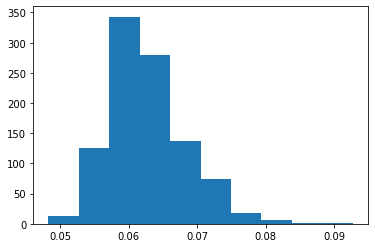

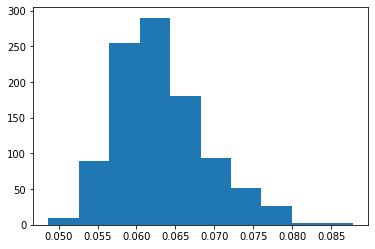

In [99]:
for case in imbalanced_cases:
    data = pd.read_csv(imbalanced_path+case, header = None)
    data = np.array(data[7]).reshape(-1,1000)
    
    plt.hist(abs(pd.DataFrame(model.predict(data)) - pd.DataFrame(data)).mean())
    plt.show()

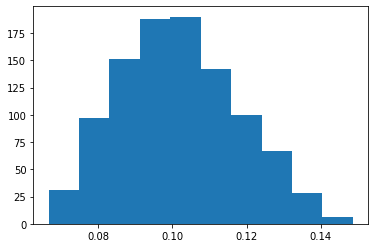

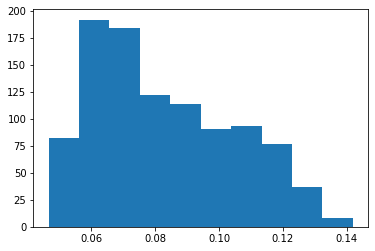

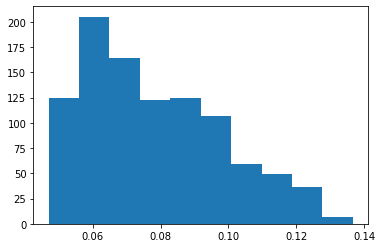

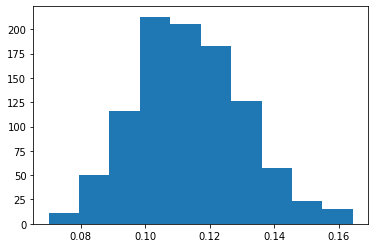

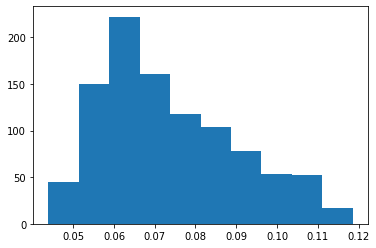

...

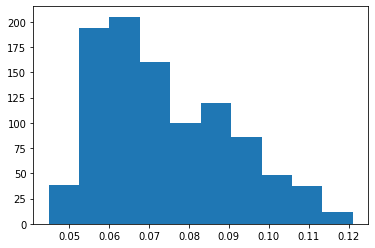

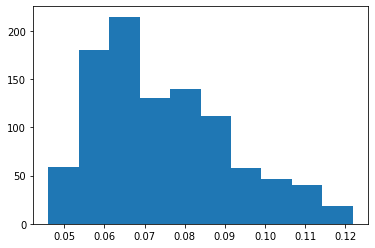

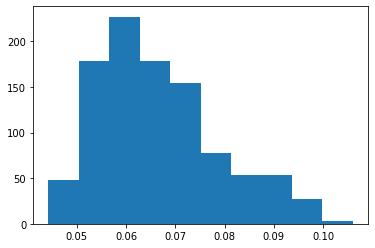

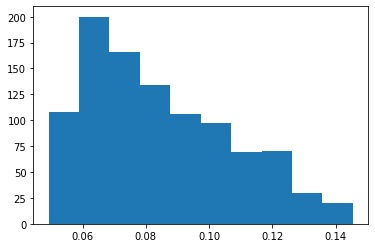

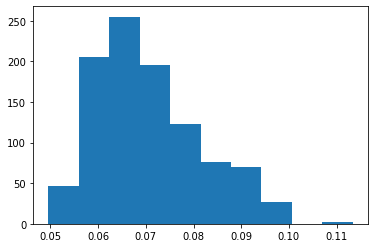

In [100]:
for case in misalignment_cases:
    data = pd.read_csv(misalignment_path+case, header = None)
    data = np.array(data[7]).reshape(-1,1000)
    
    plt.hist(abs(pd.DataFrame(model.predict(data)) - pd.DataFrame(data)).mean())
    plt.show()

In [907]:
model.predict(data)[0].shape

(1000,)

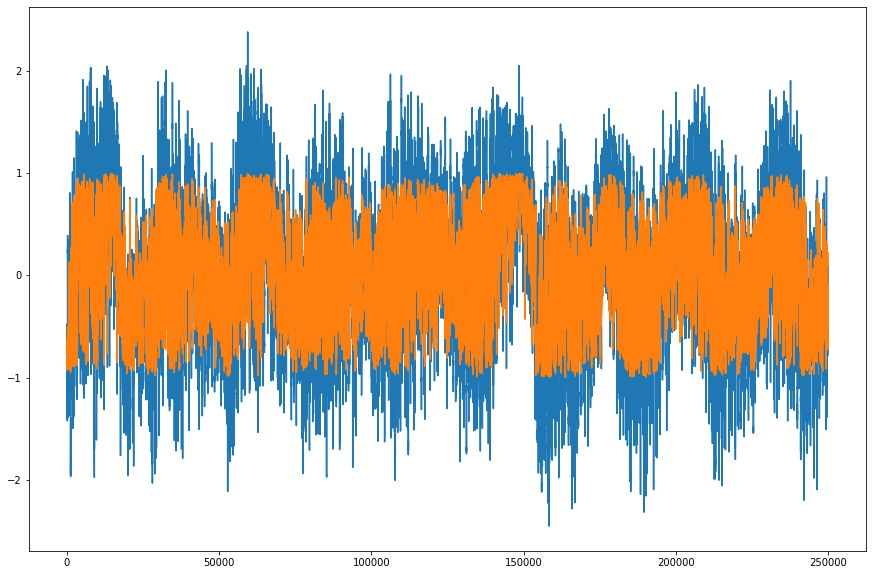

In [11]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
plt.plot(data.flatten())
plt.plot(model.predict(data).flatten())

In [12]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [23]:
(true-pred).mean(axis=1)

AxisError: axis 1 is out of bounds for array of dimension 1

In [31]:
np.diff([true, pred]).mean(axis=0)

array([-0.08006154,  0.07154112, -0.04774368, ...,  0.00020219,
       -0.00644117, -0.00147701])

In [67]:
true = data.flatten()
pred = model.predict(data).flatten()

errors = abs(pd.DataFrame(model.predict(data)) - pd.DataFrame(data)).mean()

statistics = {'STD': errors.std(), 
 'Skewness': errors.skew(), 
 'IQR': errors.quantile(.75)-errors.quantile(.25) , 
 'Mean': errors.mean(),
 'Median': errors.median()
}


fig = make_subplots(rows=2, cols=2, shared_xaxes=True, vertical_spacing=0.18, row_width=[0.2, 0.3], 
                       specs=[[{"colspan": 2}, None], [{}, {}]],)
fig.add_trace(go.Scatter(y=true, mode='lines', line=dict(color='steelblue', width=2), name='Показания'),
                  row=1, col=1)  
fig.add_trace(go.Scatter(y=pred, mode='lines', line=dict(color='salmon', width=2), name='Выходные данные'),
                  row=1, col=1)  

fig.add_trace(go.Histogram(x=errors, name='Распределение ошибок'),
                  row=2, col=1),
fig.add_trace(go.Bar(y=list(statistics), x = list(statistics.values()), name='Стат. показатели ошибок', orientation='h'),
                  row=2, col=2)  



In [46]:
errors.std()

0.036869700258921244

In [48]:
statistics = {'STD': errors.std(), 
 'Skewness': errors.skew(), 
 'IQR': errors.quantile(.75)-errors.quantile(.25) , 
 'Mean': errors.mean(),
 'Median': errors.median()
}

In [55]:
list(statistics.values())

[0.036869700258921244,
 0.8216465742558023,
 0.045344610718334954,
 0.34078162242372845,
 0.33627679229777496]